# PRCP-1014-VaccinePred

## Problem Statement

#### Task 1:-Prepare a complete data analysis report on the                             given data.

#### Task 2:- Create a predictive model for studying the future                          trends of vaccine for any particular diseases. 



# importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline
import warnings
warnings.filterwarnings('ignore') 

In [2]:
# loading the data set
labels=pd.read_csv('labels.csv')
labels

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,0,0,0
1,1,0,1
2,2,0,0
3,3,0,1
4,4,0,0
...,...,...,...
26702,26702,0,0
26703,26703,0,0
26704,26704,0,1
26705,26705,0,0


# Doing some basic checks

In [3]:
# checking first 5 rows
labels.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,0,0,0
1,1,0,1
2,2,0,0
3,3,0,1
4,4,0,0


In [4]:
# checking last 5 rows
labels.tail()

,respondent_id,h1n1_vaccine,seasonal_vaccine
26702,26702,0,0
26703,26703,0,0
26704,26704,0,1
26705,26705,0,0
26706,26706,0,0


In [5]:
# checking the null values
labels.isnull().sum()

respondent_id       0
h1n1_vaccine        0
seasonal_vaccine    0
dtype: int64

In [6]:
labels.h1n1_vaccine.value_counts()

0    21033
1     5674
Name: h1n1_vaccine, dtype: int64

In [7]:
labels.seasonal_vaccine.value_counts()

0    14272
1    12435
Name: seasonal_vaccine, dtype: int64

In [8]:
# loading the another data set
features=pd.read_csv("features.csv")
features

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,...,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,...,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,...,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,...,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,...,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,...,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


In [9]:
# to display all the columns
features.head(pd.set_option('display.max_columns',None))

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


In [10]:
# checking the last 5 rows
features.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [11]:
# checking last 5 rows
features.tail()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg
26706,26706,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0,1.0,5.0,1.0,1.0,65+ Years,Some College,White,Male,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,mlyzmhmf,"MSA, Principle City",1.0,0.0,NaN,NaN


In [12]:
 # checking the information on the features
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26707 entries, 0 to 26706
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_concern                 26615 non-null  float64
 2   h1n1_knowledge               26591 non-null  float64
 3   behavioral_antiviral_meds    26636 non-null  float64
 4   behavioral_avoidance         26499 non-null  float64
 5   behavioral_face_mask         26688 non-null  float64
 6   behavioral_wash_hands        26665 non-null  float64
 7   behavioral_large_gatherings  26620 non-null  float64
 8   behavioral_outside_home      26625 non-null  float64
 9   behavioral_touch_face        26579 non-null  float64
 10  doctor_recc_h1n1             24547 non-null  float64
 11  doctor_recc_seasonal         24547 non-null  float64
 12  chronic_med_condition        25736 non-null  float64
 13  child_under_6_mo

In [13]:
# checking the null values on the features
features.isnull().sum()

respondent_id                      0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
m

# We have to merge both files

In [14]:
# combaning of two files in to  one file
Vaccine=pd.merge(features,labels)

In [15]:
Vaccine.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [16]:
# checking the shape of the data
Vaccine.shape

(26707, 38)

In [17]:
# checking the duplicate columns
Vaccine.columns.duplicated().sum()

0

# Domain Analysis

# Vaccine:
A preparation that is used to stimulate the body's immune response against diseases. Vaccines are usually administered through needle injections, but some can be administered by mouth or sprayed into the nose.

# h1n1_vaccine
The H1N1 vaccination is used to prevent infection caused by the pandemic of 2009. H1N1 vaccine works by injecting a small dose of the virus in your body. This helps your body build immunity against that disease. This vaccine cannot be used to treat an active infection that has already developed in the body.


# seasonal_vaccine
Influenza (flu) vaccines (often called “flu shots”) are vaccines that protect against the four influenza viruses that research indicates will be most common during the upcoming season.

## The goal is to predict how likely individuals are to receive their H1N1 and seasonal flu vaccines. In specific, the target is to predict two probabilities: one for h1n1_vaccine and one for seasonal_vaccine. It is a multi-label classification problem.

# EDA(EXPLORATORY DATA ANALYSIS)

In [18]:
# checcking the data in a statisticaly
Vaccine.describe()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
count,26707.000000,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,24547.000000,24547.000000,25736.000000,25887.000000,25903.000000,14433.00000,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000,26707.000000,26707.000000
mean,13353.000000,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,0.220312,0.329735,0.283261,0.082590,0.111918,0.87972,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583,0.212454,0.465608
std,7709.791156,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,0.414466,0.470126,0.450591,0.275266,0.315271,0.32530,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173,0.409052,0.498825
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,6676.500000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,13353.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,20029.500000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.00000,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000,0.000000,1.000000
max,26706.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000,1.000000,1.000000


# Univariate Analysis

In [19]:
#! pip install sweetviz

In [20]:
import sweetviz as sv
graphs=sv.analyze(Vaccine)
graphs.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# Bivariate Analysis

<AxesSubplot:xlabel='h1n1_vaccine', ylabel='count'>

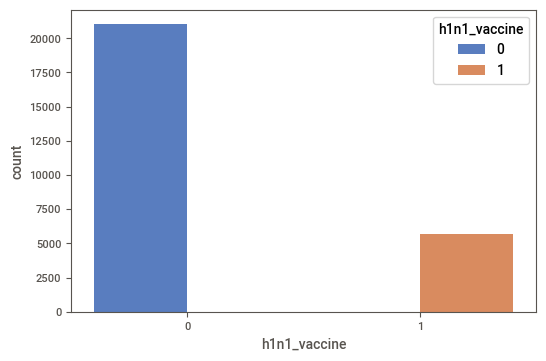

In [21]:
sns.countplot(x=Vaccine['h1n1_vaccine'],hue=Vaccine['h1n1_vaccine'],palette='muted')

<AxesSubplot:xlabel='seasonal_vaccine', ylabel='count'>

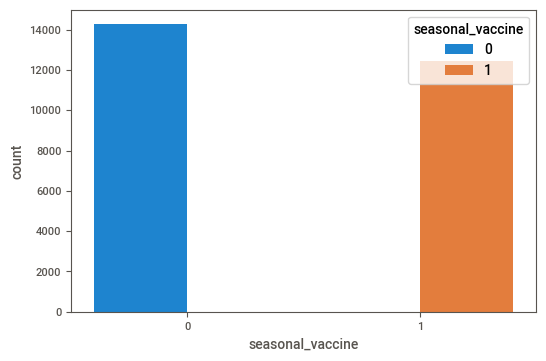

In [22]:
sns.countplot(x=Vaccine['seasonal_vaccine'],hue=Vaccine['seasonal_vaccine'])

<AxesSubplot:xlabel='doctor_recc_h1n1', ylabel='count'>

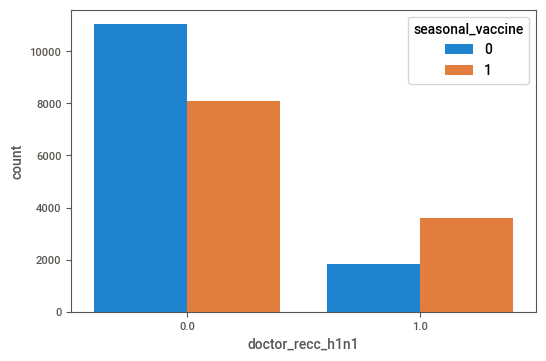

In [23]:
sns.countplot(x=Vaccine.doctor_recc_h1n1,hue=Vaccine.seasonal_vaccine)

<AxesSubplot:xlabel='doctor_recc_h1n1', ylabel='count'>

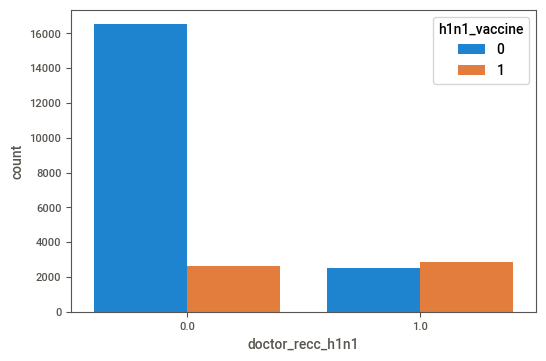

In [24]:
sns.countplot(x=Vaccine.doctor_recc_h1n1,hue=Vaccine.h1n1_vaccine)

# Handling Categorical Data

In [25]:
Vaccine.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [26]:
vaccine1=Vaccine[['age_group','education','race','sex','income_poverty',
                  'marital_status','rent_or_own','employment_status',
                  'hhs_geo_region','census_msa','employment_industry',
                  'employment_occupation']]

In [27]:
vaccine1.head()

,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,employment_industry,employment_occupation
0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,NaN,NaN
1,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",pxcmvdjn,xgwztkwe
2,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",rucpziij,xtkaffoo
3,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",NaN,NaN
4,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",wxleyezf,emcorrxb


In [28]:
vaccine1.shape

(26707, 12)

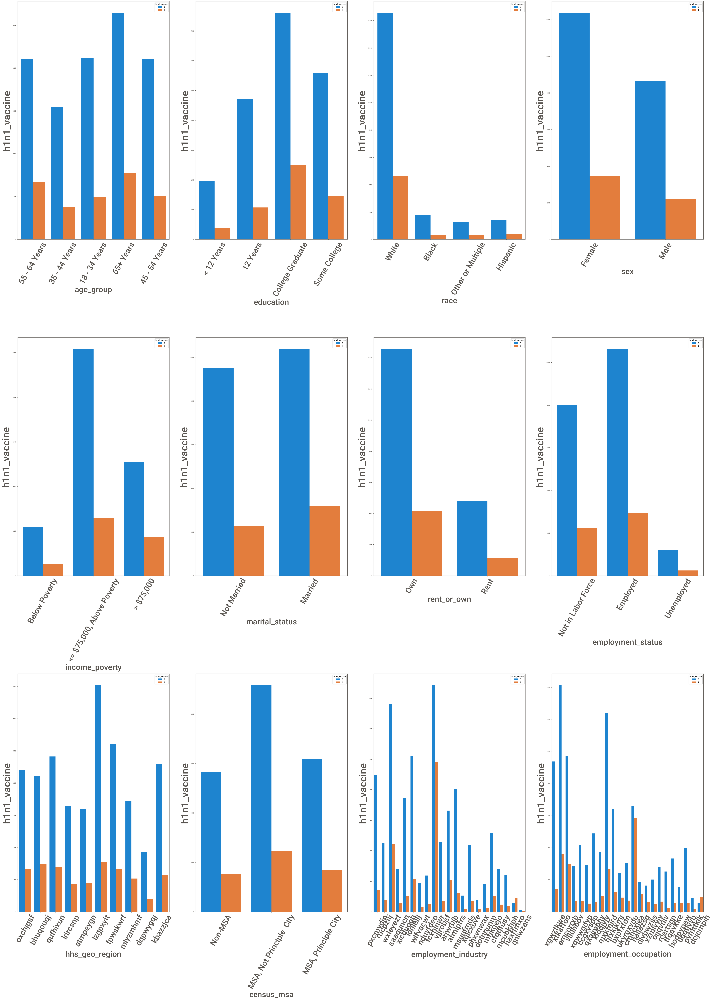

In [29]:
# ploting the count plot for the data analysis
plt.figure(figsize=(50,70), facecolor='white')#canvas size
plotnumber = 1#count variable

for column in vaccine1:
    if plotnumber<=12 :
        ax = plt.subplot(3,4,plotnumber)
        sns.countplot(x=vaccine1[column].dropna(axis=0),hue=Vaccine.h1n1_vaccine)
        plt.xlabel(column,fontsize=40)
        plt.ylabel('h1n1_vaccine',fontsize=50)
        plt.xticks(fontsize=40, rotation=60)
    plotnumber+=1
plt.tight_layout()

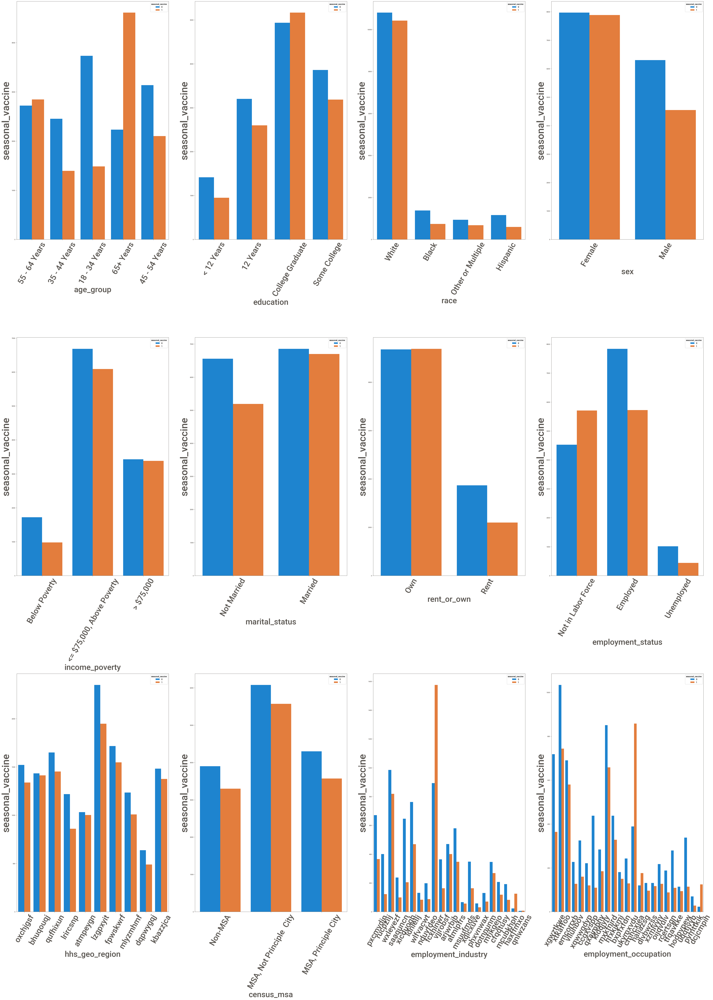

In [30]:
plt.figure(figsize=(50,70), facecolor='white')#canvas size
plotnumber = 1#count variable

for column in vaccine1:
    if plotnumber<=12 :
        ax = plt.subplot(3,4,plotnumber)
        sns.countplot(x=vaccine1[column].dropna(axis=0),hue=Vaccine.seasonal_vaccine)
        plt.xlabel(column,fontsize=40)
        plt.ylabel('seasonal_vaccine',fontsize=50)
        plt.xticks(fontsize=40, rotation=60)
    plotnumber+=1
plt.tight_layout()

# Discrete data

In [31]:
Vaccine.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [32]:
discretedata=Vaccine[["h1n1_concern",'h1n1_knowledge','behavioral_antiviral_meds',
                      'behavioral_avoidance','behavioral_face_mask',
                      'behavioral_wash_hands','behavioral_large_gatherings',
                      'behavioral_outside_home','behavioral_touch_face',
                      'doctor_recc_h1n1','doctor_recc_seasonal','chronic_med_condition',
                      'child_under_6_months','health_worker','health_insurance',
                      'opinion_h1n1_vacc_effective','opinion_h1n1_risk',
                      'opinion_h1n1_sick_from_vacc','opinion_seas_vacc_effective',
                      'opinion_seas_risk','opinion_seas_sick_from_vacc',
                      'household_adults','household_children',
                      'h1n1_vaccine','seasonal_vaccine']]

In [33]:
discretedata

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,0.0,0.0,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,0.0,0.0,0,1
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,2.0,0.0,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,0.0,0.0,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,1.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,0.0,0.0,0,0
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,1.0,0.0,0,0
26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,0.0,0.0,0,1
26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,1.0,0.0,0,0


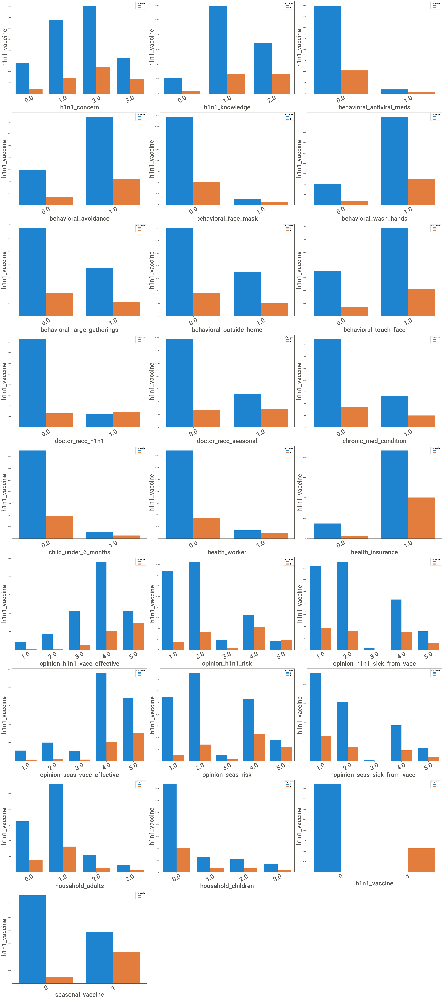

In [34]:
# ploting the count plots for comparing the data
plt.figure(figsize=(40,90),facecolor='white')
plotnumber=1
for columns in discretedata:
    if plotnumber<=25:
        ax=plt.subplot(9,3,plotnumber)
        sns.countplot(x=discretedata[columns].dropna(axis=0)
                     ,hue=Vaccine.h1n1_vaccine)
        plt.xlabel(columns,fontsize=40)
        plt.ylabel('h1n1_vaccine',fontsize=40)
        plt.xticks(fontsize=40,rotation=30)
    plotnumber+=1
plt.tight_layout()

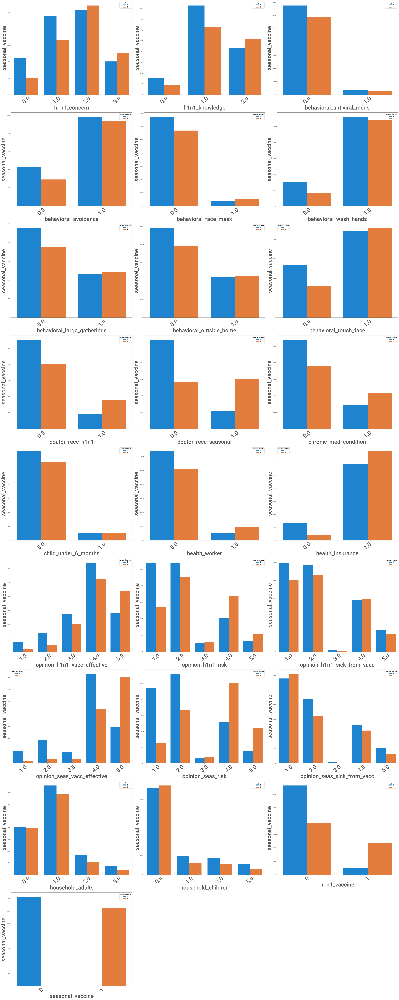

In [35]:
plt.figure(figsize=(40,100),facecolor='white')
plotnumber=1
for columns in discretedata:
    if plotnumber<=25:
        ax=plt.subplot(9,3,plotnumber)
        sns.countplot(x=discretedata[columns].dropna(axis=0)
                     ,hue=Vaccine.seasonal_vaccine)
        plt.xlabel(columns,fontsize=40)
        plt.ylabel("seasonal_vaccine",fontsize=40)
        plt.xticks(fontsize=40,rotation=40)
    plotnumber+=1
plt.tight_layout()

# Insights from univariant,Bivaraite Analysis..

# Data Preprocessing and Feature engineering

In [36]:
Vaccine

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea,0,0
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN,0,1
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg,0,0


In [37]:
# checking the discribe function
Vaccine.describe()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
count,26707.000000,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,24547.000000,24547.000000,25736.000000,25887.000000,25903.000000,14433.00000,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000,26707.000000,26707.000000
mean,13353.000000,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,0.220312,0.329735,0.283261,0.082590,0.111918,0.87972,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583,0.212454,0.465608
std,7709.791156,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,0.414466,0.470126,0.450591,0.275266,0.315271,0.32530,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173,0.409052,0.498825
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,6676.500000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,13353.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,20029.500000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.00000,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000,0.000000,1.000000
max,26706.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000,1.000000,1.000000


In [38]:
# checking for null values
Vaccine.isnull().sum()

respondent_id                      0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
m

In [39]:
# checking the count value for the given data
Vaccine.h1n1_concern.value_counts()

2.0    10575
1.0     8153
3.0     4591
0.0     3296
Name: h1n1_concern, dtype: int64

In [40]:
# here we use most frequently accuring data 
Vaccine.loc[Vaccine['h1n1_concern'].isnull()==True,'h1n1_concern']='2.0'  #we will use most frequent occured values

In [41]:
Vaccine.h1n1_knowledge.value_counts()

1.0    14598
2.0     9487
0.0     2506
Name: h1n1_knowledge, dtype: int64

In [42]:
Vaccine.loc[Vaccine['h1n1_knowledge'].isnull()==True,'h1n1_knowledge']='1.0'

In [43]:
Vaccine.behavioral_antiviral_meds.value_counts()

0.0    25335
1.0     1301
Name: behavioral_antiviral_meds, dtype: int64

In [44]:
Vaccine.loc[Vaccine['behavioral_antiviral_meds'].isnull()==True,'behavioral_antiviral_meds']='0.0'

In [45]:
Vaccine.behavioral_avoidance.value_counts()

1.0    19228
0.0     7271
Name: behavioral_avoidance, dtype: int64

In [46]:
Vaccine.loc[Vaccine['behavioral_avoidance'].isnull()==True,'behavioral_avoidance']='1.0'

In [47]:
Vaccine.behavioral_face_mask.value_counts()

0.0    24847
1.0     1841
Name: behavioral_face_mask, dtype: int64

In [48]:
Vaccine.loc[Vaccine['behavioral_face_mask'].isnull()==True,'behavioral_face_mask']='0.0'

In [49]:
Vaccine.behavioral_wash_hands.value_counts()

1.0    22015
0.0     4650
Name: behavioral_wash_hands, dtype: int64

In [50]:
Vaccine.loc[Vaccine['behavioral_wash_hands'].isnull()==True,'behavioral_wash_hands']='1.0'

In [51]:
Vaccine.behavioral_large_gatherings.value_counts()

0.0    17073
1.0     9547
Name: behavioral_large_gatherings, dtype: int64

In [52]:
Vaccine.loc[Vaccine['behavioral_large_gatherings'].isnull()==True,'behavioral_large_gatherings']='0.0'

In [53]:
Vaccine.behavioral_outside_home.value_counts()

0.0    17644
1.0     8981
Name: behavioral_outside_home, dtype: int64

In [54]:
Vaccine.loc[Vaccine['behavioral_outside_home'].isnull()==True,'behavioral_outside_home']='0.0'

In [55]:
Vaccine.behavioral_touch_face.value_counts()

1.0    18001
0.0     8578
Name: behavioral_touch_face, dtype: int64

In [56]:
Vaccine.loc[Vaccine['behavioral_touch_face'].isnull()==True,'behavioral_touch_face']='1.0'

In [57]:
Vaccine.doctor_recc_h1n1.value_counts()

0.0    19139
1.0     5408
Name: doctor_recc_h1n1, dtype: int64

In [58]:
Vaccine.loc[Vaccine['doctor_recc_h1n1'].isnull()==True,'doctor_recc_h1n1']='0.0'

In [59]:
Vaccine.doctor_recc_seasonal.value_counts()

0.0    16453
1.0     8094
Name: doctor_recc_seasonal, dtype: int64

In [60]:
Vaccine.loc[Vaccine['doctor_recc_seasonal'].isnull()==True,'doctor_recc_seasonal']='0.0'

In [61]:
Vaccine.chronic_med_condition.value_counts()

0.0    18446
1.0     7290
Name: chronic_med_condition, dtype: int64

In [62]:
Vaccine.loc[Vaccine['chronic_med_condition'].isnull()==True,'chronic_med_condition']='0.0'

In [63]:
Vaccine.child_under_6_months.value_counts()

0.0    23749
1.0     2138
Name: child_under_6_months, dtype: int64

In [64]:
Vaccine.loc[Vaccine['child_under_6_months'].isnull()==True,'child_under_6_months']='0.0'

In [65]:
Vaccine.health_worker.value_counts()

0.0    23004
1.0     2899
Name: health_worker, dtype: int64

In [66]:
Vaccine.loc[Vaccine['health_worker'].isnull()==True,'health_worker']='0.0'

In [67]:
Vaccine.health_insurance.value_counts()

1.0    12697
0.0     1736
Name: health_insurance, dtype: int64

In [68]:
Vaccine.loc[Vaccine['health_insurance'].isnull()==True,'health_insurance']='1.0'

In [69]:
Vaccine.opinion_h1n1_vacc_effective.value_counts()

4.0    11683
5.0     7166
3.0     4723
2.0     1858
1.0      886
Name: opinion_h1n1_vacc_effective, dtype: int64

In [70]:
Vaccine.loc[Vaccine['opinion_h1n1_vacc_effective'].isnull()==True,'opinion_h1n1_vacc_effective']='4.0'

In [71]:
Vaccine.opinion_h1n1_risk.value_counts()

2.0    9919
1.0    8139
4.0    5394
5.0    1750
3.0    1117
Name: opinion_h1n1_risk, dtype: int64

In [72]:
Vaccine.loc[Vaccine['opinion_h1n1_risk'].isnull()==True,'opinion_h1n1_risk']='2.0'

In [73]:
Vaccine.opinion_h1n1_sick_from_vacc.value_counts()

2.0    9129
1.0    8998
4.0    5850
5.0    2187
3.0     148
Name: opinion_h1n1_sick_from_vacc, dtype: int64

In [74]:
Vaccine.loc[Vaccine['opinion_h1n1_sick_from_vacc'].isnull()==True,'opinion_h1n1_sick_from_vacc']='2.0'

In [75]:
Vaccine.opinion_seas_vacc_effective.value_counts()

4.0    11629
5.0     9973
2.0     2206
1.0     1221
3.0     1216
Name: opinion_seas_vacc_effective, dtype: int64

In [76]:
Vaccine.loc[Vaccine['opinion_seas_vacc_effective'].isnull()==True,'opinion_seas_vacc_effective']='4.0'

In [77]:
Vaccine.opinion_seas_risk.value_counts()

2.0    8954
4.0    7630
1.0    5974
5.0    2958
3.0     677
Name: opinion_seas_risk, dtype: int64

In [78]:
Vaccine.loc[Vaccine['opinion_seas_risk'].isnull()==True,'opinion_seas_risk']='2.0'

In [79]:
Vaccine.opinion_seas_sick_from_vacc.value_counts()

1.0    11870
2.0     7633
4.0     4852
5.0     1721
3.0       94
Name: opinion_seas_sick_from_vacc, dtype: int64

In [80]:
Vaccine.loc[Vaccine['opinion_seas_sick_from_vacc'].isnull()==True,'opinion_seas_sick_from_vacc']='2.0'

In [81]:
Vaccine.education.value_counts()

College Graduate    10097
Some College         7043
12 Years             5797
< 12 Years           2363
Name: education, dtype: int64

In [82]:
Vaccine.loc[Vaccine['education'].isnull()==True,'education']='College Graduate'

In [83]:
Vaccine.income_poverty.value_counts()

<= $75,000, Above Poverty    12777
> $75,000                     6810
Below Poverty                 2697
Name: income_poverty, dtype: int64

In [84]:
Vaccine.loc[Vaccine['income_poverty'].isnull()==True,'income_poverty']='<= $75,000, Above Poverty'

In [85]:
Vaccine.marital_status.value_counts()

Married        13555
Not Married    11744
Name: marital_status, dtype: int64

In [86]:
Vaccine.loc[Vaccine['marital_status'].isnull()==True,'marital_status']='Married'

In [87]:
Vaccine.rent_or_own.value_counts()

Own     18736
Rent     5929
Name: rent_or_own, dtype: int64

In [88]:
Vaccine.loc[Vaccine['rent_or_own'].isnull()==True,'rent_or_own']='Own'

In [89]:
Vaccine.employment_status.value_counts()

Employed              13560
Not in Labor Force    10231
Unemployed             1453
Name: employment_status, dtype: int64

In [90]:
Vaccine.loc[Vaccine['employment_status'].isnull()==True,'employment_status']='Employed'

In [91]:
Vaccine.household_adults.value_counts()

1.0    14474
0.0     8056
2.0     2803
3.0     1125
Name: household_adults, dtype: int64

In [92]:
Vaccine.loc[Vaccine['household_adults'].isnull()==True,'household_adults']='1.0'

In [93]:
Vaccine.household_children.value_counts()

0.0    18672
1.0     3175
2.0     2864
3.0     1747
Name: household_children, dtype: int64

In [94]:
Vaccine.loc[Vaccine['household_children'].isnull()==True,'household_children']='0.0'

In [95]:
Vaccine.employment_industry.value_counts()

fcxhlnwr    2468
wxleyezf    1804
ldnlellj    1231
pxcmvdjn    1037
atmlpfrs     926
arjwrbjb     871
xicduogh     851
mfikgejo     614
vjjrobsf     527
rucpziij     523
xqicxuve     511
saaquncn     338
cfqqtusy     325
nduyfdeo     286
mcubkhph     275
wlfvacwt     215
dotnnunm     201
haxffmxo     148
msuufmds     124
phxvnwax      89
qnlwzans      13
Name: employment_industry, dtype: int64

In [96]:
Vaccine.loc[Vaccine['employment_industry'].isnull()==True,'employment_industry']='fcxhlnwr'

In [97]:
Vaccine.employment_occupation.value_counts()

xtkaffoo    1778
mxkfnird    1509
emcorrxb    1270
cmhcxjea    1247
xgwztkwe    1082
hfxkjkmi     766
qxajmpny     548
xqwwgdyp     485
kldqjyjy     469
uqqtjvyb     452
tfqavkke     388
ukymxvdu     372
vlluhbov     354
oijqvulv     344
ccgxvspp     341
bxpfxfdn     331
haliazsg     296
rcertsgn     276
xzmlyyjv     248
dlvbwzss     227
hodpvpew     208
dcjcmpih     148
pvmttkik      98
Name: employment_occupation, dtype: int64

In [98]:
Vaccine.loc[Vaccine['employment_occupation'].isnull()==True,'employment_occupation']='xtkaffoo'

In [99]:
Vaccine.isnull().sum()

respondent_id                  0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment_status              0
hhs_geo_re

In [100]:
Vaccine

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,fcxhlnwr,xtkaffoo,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,fcxhlnwr,xtkaffoo,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,fcxhlnwr,xtkaffoo,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea,0,0
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Employed,lzgpxyit,"MSA, Not Principle City",0.0,0.0,fcxhlnwr,xtkaffoo,0,1
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg,0,0


In [101]:
# conversion of categorical data in to numerical data by using of label encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [102]:
Vaccine.age_group=le.fit_transform(Vaccine.age_group)
Vaccine.education=le.fit_transform(Vaccine.education)
Vaccine.race=le.fit_transform(Vaccine.race)
Vaccine.sex=le.fit_transform(Vaccine.sex)
Vaccine.income_poverty=le.fit_transform(Vaccine.income_poverty)
Vaccine.marital_status=le.fit_transform(Vaccine.marital_status)
Vaccine.rent_or_own=le.fit_transform(Vaccine.rent_or_own)
Vaccine.employment_status=le.fit_transform(Vaccine.employment_status)
Vaccine.hhs_geo_region=le.fit_transform(Vaccine.hhs_geo_region)
Vaccine.census_msa=le.fit_transform(Vaccine.census_msa)
Vaccine.employment_industry=le.fit_transform(Vaccine.employment_industry)
Vaccine.employment_occupation=le.fit_transform(Vaccine.employment_occupation)

In [103]:
Vaccine

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3,0,2,1,1,1,5,1,0.0,0.0,4,21,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,3,0,0,1,0,1,9,2,0.0,0.0,4,21,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,3,1,0,1,1,0,6,1,1.0,0.0,4,2,0,0
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,3,0,0,1,0,0,6,0,0.0,0.0,4,21,0,1
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,0,3,1,0,0,0,1,0,5,2,1.0,0.0,4,6,0,0


# Converting the object type into float values

In [104]:
Vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   respondent_id                26707 non-null  int64 
 1   h1n1_concern                 26707 non-null  object
 2   h1n1_knowledge               26707 non-null  object
 3   behavioral_antiviral_meds    26707 non-null  object
 4   behavioral_avoidance         26707 non-null  object
 5   behavioral_face_mask         26707 non-null  object
 6   behavioral_wash_hands        26707 non-null  object
 7   behavioral_large_gatherings  26707 non-null  object
 8   behavioral_outside_home      26707 non-null  object
 9   behavioral_touch_face        26707 non-null  object
 10  doctor_recc_h1n1             26707 non-null  object
 11  doctor_recc_seasonal         26707 non-null  object
 12  chronic_med_condition        26707 non-null  object
 13  child_under_6_months         26

In [105]:
Vaccine['h1n1_concern']=Vaccine['h1n1_concern'].astype('float')
Vaccine['h1n1_knowledge']=Vaccine['h1n1_knowledge'].astype('float')
Vaccine['behavioral_antiviral_meds']=Vaccine['behavioral_antiviral_meds'].astype('float')
Vaccine['behavioral_avoidance']=Vaccine['behavioral_avoidance'].astype('float')
Vaccine['behavioral_face_mask']=Vaccine['behavioral_face_mask'].astype('float')
Vaccine['behavioral_wash_hands']=Vaccine['behavioral_wash_hands'].astype('float')
Vaccine['behavioral_large_gatherings']=Vaccine['behavioral_large_gatherings'].astype('float')
Vaccine['behavioral_outside_home']=Vaccine['behavioral_outside_home'].astype('float')
Vaccine['behavioral_touch_face']=Vaccine['behavioral_touch_face'].astype('float')
Vaccine['doctor_recc_h1n1']=Vaccine['doctor_recc_h1n1'].astype('float')
Vaccine['doctor_recc_seasonal']=Vaccine['doctor_recc_seasonal'].astype('float')
Vaccine['chronic_med_condition']=Vaccine['chronic_med_condition'].astype('float')
Vaccine['child_under_6_months']=Vaccine['child_under_6_months'].astype('float')
Vaccine['health_worker']=Vaccine['health_worker'].astype('float')
Vaccine['health_insurance']=Vaccine['health_insurance'].astype('float')
Vaccine['opinion_h1n1_vacc_effective']=Vaccine['opinion_h1n1_vacc_effective'].astype('float')
Vaccine['opinion_h1n1_risk']=Vaccine['opinion_h1n1_risk'].astype('float')
Vaccine['opinion_h1n1_sick_from_vacc']=Vaccine['opinion_h1n1_sick_from_vacc'].astype('float')
Vaccine['opinion_seas_vacc_effective']=Vaccine['opinion_seas_vacc_effective'].astype('float')
Vaccine['opinion_seas_risk']=Vaccine['opinion_seas_risk'].astype('float')
Vaccine['opinion_seas_sick_from_vacc']=Vaccine['opinion_seas_sick_from_vacc'].astype('float')
Vaccine['household_adults']=Vaccine['household_adults'].astype('float')
Vaccine['household_children']=Vaccine['household_children'].astype('float')

In [106]:
Vaccine.h1n1_knowledge.value_counts()

1.0    14714
2.0     9487
0.0     2506
Name: h1n1_knowledge, dtype: int64

In [107]:
Vaccine.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26707 entries, 0 to 26706
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   respondent_id                26707 non-null  int64  
 1   h1n1_concern                 26707 non-null  float64
 2   h1n1_knowledge               26707 non-null  float64
 3   behavioral_antiviral_meds    26707 non-null  float64
 4   behavioral_avoidance         26707 non-null  float64
 5   behavioral_face_mask         26707 non-null  float64
 6   behavioral_wash_hands        26707 non-null  float64
 7   behavioral_large_gatherings  26707 non-null  float64
 8   behavioral_outside_home      26707 non-null  float64
 9   behavioral_touch_face        26707 non-null  float64
 10  doctor_recc_h1n1             26707 non-null  float64
 11  doctor_recc_seasonal         26707 non-null  float64
 12  chronic_med_condition        26707 non-null  float64
 13  child_under_6_mo

# Analysing the data 

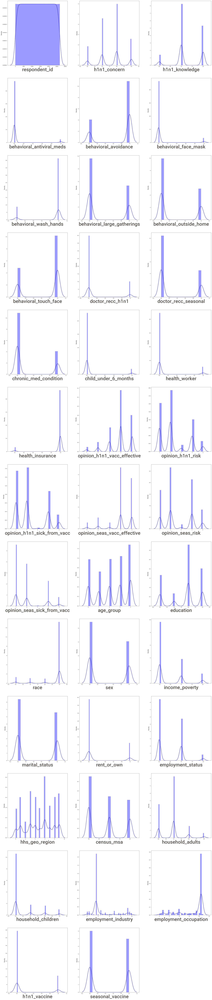

In [108]:
plt.figure(figsize=(30,150))
plotnumber=1
for columns in Vaccine:
    if plotnumber<=38:
        ax=plt.subplot(13,3,plotnumber)
        sns.distplot(x=Vaccine[columns],color='blue')
        plt.xlabel(columns,fontsize=40)
        plotnumber+=1
plt.show()

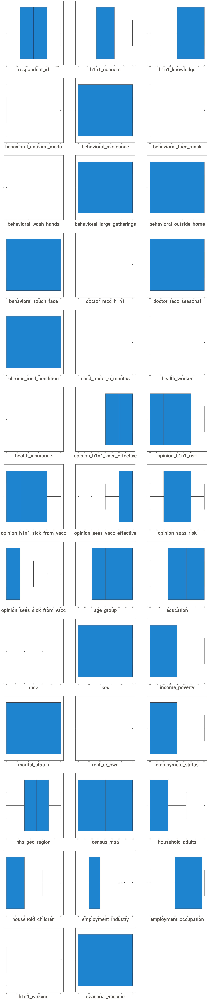

In [110]:
# here we use the box plot to check the outlayers
plt.figure(figsize=(30,150),facecolor='white')
plotnumber=1
for columns in Vaccine:
    if plotnumber<=38:
        ax=plt.subplot(13,3,plotnumber)
        sns.boxplot(Vaccine[columns])
        plt.xlabel(columns,fontsize=40)
        plotnumber+=1
plt.show()

# from the above boxplots we have confirm  that we have some out layers in the data so we have to  handel the out layers ...

# Handling the out layers

In [111]:
from scipy import stats

# behavioral_antiviral_meds

In [112]:
# calculating the inter quartal range
IQR=stats.iqr(Vaccine.behavioral_antiviral_meds,interpolation='midpoint')
IQR

0.0

In [113]:
# defining the 25% of the data
q1=Vaccine.behavioral_antiviral_meds.quantile(0.25)
# defining the 75% of the data 
q3=Vaccine.behavioral_antiviral_meds.quantile(0.75)

min_limit=q1 - 1.5*IQR #setting minimum limit

max_limit=q3 + 1.5*IQR #setting maximum limit

In [114]:
min_limit

0.0

In [115]:
max_limit

0.0

In [116]:
# checking the minimum limit
Vaccine.loc[Vaccine['behavioral_antiviral_meds']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [117]:
# checking the maximum limit
Vaccine.loc[Vaccine['behavioral_antiviral_meds']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
23,23,3.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,4.0,4.0,4.0,4.0,0,1,0,0,2,1,1,1,6,2,1.0,2.0,4,21,0,0
35,35,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,5.0,5.0,5.0,2.0,5.0,3,1,1,0,0,1,1,1,8,1,0.0,0.0,4,21,1,1
43,43,2.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,1.0,4.0,4.0,0,2,0,1,1,1,1,1,6,1,0.0,1.0,4,21,1,1
45,45,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,2.0,4.0,4.0,5.0,0,3,3,0,1,0,1,0,7,0,2.0,1.0,16,10,0,0
70,70,2.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,1.0,5.0,5.0,2.0,5.0,0,2,3,1,0,0,0,0,1,0,2.0,1.0,20,10,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26642,26642,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,5.0,5.0,2,0,3,0,0,1,0,0,9,2,1.0,0.0,12,19,0,0
26658,26658,1.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,2.0,5.0,2.0,2.0,2,3,3,1,0,0,0,0,6,2,1.0,1.0,0,13,0,0
26677,26677,3.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,1.0,2.0,5.0,5.0,5.0,1,0,1,1,2,0,1,0,3,0,3.0,0.0,19,13,0,0
26683,26683,1.0,2.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,3,2,3,0,1,0,0,0,3,0,1.0,0.0,4,2,1,1


In [118]:
# adding mean to that column for handel the out layers
Vaccine.loc[Vaccine['behavioral_antiviral_meds']>max_limit,'behavioral_antiviral_meds']=np.median(Vaccine.behavioral_antiviral_meds)

In [119]:
# checking whther the values are assigined or not
Vaccine.loc[Vaccine['behavioral_antiviral_meds']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# behavioral_face_mask

In [120]:
IQR=stats.iqr(Vaccine.behavioral_face_mask,interpolation='midpoint')
IQR

0.0

In [121]:
q1=Vaccine.behavioral_face_mask.quantile(0.25)
q3=Vaccine.behavioral_face_mask.quantile(0.75)
q1

0.0

In [122]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [123]:
Vaccine.loc[Vaccine['behavioral_face_mask']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [124]:
Vaccine.loc[Vaccine['behavioral_face_mask']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
20,20,3.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,0,0,0,1,1,1,9,1,0.0,0.0,4,21,0,0
35,35,2.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,5.0,5.0,5.0,2.0,5.0,3,1,1,0,0,1,1,1,8,1,0.0,0.0,4,21,1,1
48,48,3.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,1.0,5.0,5.0,1.0,2,2,3,0,0,0,0,0,5,2,1.0,0.0,18,5,1,1
57,57,3.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,4.0,1.0,3,1,3,1,0,0,0,0,4,1,1.0,0.0,19,13,1,1
84,84,2.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,5.0,4.0,1.0,5.0,4.0,1.0,4,0,3,0,0,0,0,1,0,2,1.0,0.0,4,21,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26677,26677,3.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,5.0,1.0,2.0,5.0,5.0,5.0,1,0,1,1,2,0,1,0,3,0,3.0,0.0,19,13,0,0
26683,26683,1.0,2.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,3,2,3,0,1,0,0,0,3,0,1.0,0.0,4,2,1,1
26687,26687,3.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,5.0,5.0,5.0,5.0,4.0,1.0,4,0,3,0,0,1,0,1,6,0,0.0,0.0,4,21,0,1
26691,26691,2.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,1.0,4.0,4.0,1.0,3,2,3,0,1,0,1,0,3,0,0.0,0.0,0,8,0,0


In [125]:
Vaccine.loc[Vaccine['behavioral_face_mask']>max_limit,'behavioral_face_mask']=np.median(Vaccine.behavioral_face_mask)

In [126]:
Vaccine.loc[Vaccine['behavioral_face_mask']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# behavioral_wash_hands

In [127]:
IQR=stats.iqr(Vaccine.behavioral_wash_hands,interpolation='midpoint')

In [128]:
q1=Vaccine.behavioral_wash_hands.quantile(0.25)
q3=Vaccine.behavioral_wash_hands.quantile(0.75)

In [129]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR
min_limit

1.0

In [130]:
Vaccine.loc[Vaccine['behavioral_wash_hands']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21,0,0
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3,1,0,1,0,0,9,0,2.0,0.0,14,21,0,0
6,6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,2.0,1.0,3,1,3,1,0,1,0,0,9,0,0.0,0.0,19,21,0,0
9,9,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,0,3,1,0,1,0,1,9,0,0.0,0.0,4,21,0,0
15,15,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,1.0,1,2,3,0,1,0,0,0,6,0,1.0,3.0,18,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26689,26689,2.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,3.0,3.0,1.0,1,0,0,1,1,0,0,0,5,0,1.0,3.0,5,3,0,1
26695,26695,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,4.0,3.0,1.0,1.0,0,3,3,1,1,1,1,0,5,1,0.0,0.0,1,21,0,0
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,3,0,0,1,0,1,9,2,0.0,0.0,4,21,0,0
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,0,3,1,0,0,0,1,0,5,2,1.0,0.0,4,6,0,0


In [131]:
Vaccine.loc[Vaccine['behavioral_wash_hands']<min_limit,'behavioral_wash_hands']=np.median(Vaccine.behavioral_wash_hands)

In [132]:
Vaccine.loc[Vaccine['behavioral_wash_hands']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [133]:
Vaccine.loc[Vaccine['behavioral_wash_hands']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# doctor_recc_h1n1

In [134]:
IQR=stats.iqr(Vaccine.doctor_recc_h1n1,interpolation='midpoint')
IQR

0.0

In [135]:
q1=Vaccine.doctor_recc_h1n1.quantile(0.25)
q3=Vaccine.doctor_recc_h1n1.quantile(0.75)


In [136]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [137]:
Vaccine.loc[Vaccine['doctor_recc_h1n1']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [138]:
Vaccine.loc[Vaccine['doctor_recc_h1n1']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
7,7,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,5.0,2.0,1.0,4.0,2.0,1.0,2,3,3,0,0,0,0,0,1,2,2.0,0.0,12,20,1,1
16,16,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,3.0,2.0,1.0,4.0,4.0,1.0,4,0,3,0,0,0,0,1,8,1,0.0,0.0,4,21,1,1
17,17,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,2.0,4.0,4.0,2.0,1.0,1,3,3,0,0,1,0,0,6,0,1.0,0.0,14,21,0,0
18,18,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,5.0,4.0,2.0,4,2,3,1,1,0,0,0,8,2,2.0,0.0,17,19,0,0
20,20,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,0,0,0,1,1,1,9,1,0.0,0.0,4,21,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26688,26688,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,5.0,5.0,4.0,5.0,5.0,4.0,2,0,3,1,0,1,1,1,6,0,0.0,0.0,4,21,1,1
26696,26696,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,5.0,4.0,2,3,3,1,0,0,0,0,1,1,1.0,0.0,15,10,1,1
26697,26697,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,4,2,3,1,1,0,0,1,4,1,1.0,0.0,4,21,0,0
26700,26700,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,5.0,4.0,5.0,3,0,3,0,1,0,0,1,6,1,1.0,0.0,4,21,0,1


In [139]:
Vaccine.loc[Vaccine['doctor_recc_h1n1']>max_limit,'doctor_recc_h1n1']=np.median(Vaccine.doctor_recc_h1n1)

In [140]:
Vaccine.loc[Vaccine['doctor_recc_h1n1']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# child_under_6_months	

In [141]:
IQR=stats.iqr(Vaccine.child_under_6_months,interpolation='midpoint')
IQR

0.0

In [142]:
q1=Vaccine.child_under_6_months.quantile(0.25)
q3=Vaccine.child_under_6_months.quantile(0.75)


In [143]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [144]:
Vaccine.loc[Vaccine['child_under_6_months']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [145]:
Vaccine.loc[Vaccine['child_under_6_months']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
10,10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13,1,1
13,13,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,3.0,1.0,4.0,4.0,2.0,4.0,1,3,3,1,1,0,0,0,6,0,1.0,2.0,6,9,0,0
34,34,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,5.0,1.0,2.0,4.0,2.0,1.0,0,2,3,1,1,0,0,0,7,0,1.0,2.0,18,0,1,1
41,41,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,2.0,3,3,3,0,1,0,0,0,9,0,1.0,0.0,4,2,1,1
47,47,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,5.0,1.0,2.0,5.0,1.0,2.0,0,2,3,1,1,0,0,0,7,0,1.0,0.0,16,21,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26661,26661,3.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,4.0,5.0,4.0,4.0,2.0,4.0,0,2,0,0,0,1,1,0,6,1,0.0,0.0,4,2,0,0
26666,26666,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,4.0,2.0,2.0,5.0,2.0,2.0,4,0,3,0,0,0,0,1,3,2,1.0,0.0,4,21,0,1
26687,26687,3.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,5.0,5.0,5.0,5.0,4.0,1.0,4,0,3,0,0,1,0,1,6,0,0.0,0.0,4,21,0,1
26688,26688,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,5.0,5.0,4.0,5.0,5.0,4.0,2,0,3,1,0,1,1,1,6,0,0.0,0.0,4,21,1,1


In [146]:
Vaccine.loc[Vaccine['child_under_6_months']>max_limit,'child_under_6_months']=np.median(Vaccine.child_under_6_months)

In [147]:
Vaccine.loc[Vaccine['child_under_6_months']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# health_worker

In [148]:
IQR=stats.iqr(Vaccine.health_worker,interpolation='midpoint')
IQR

0.0

In [149]:
q1=Vaccine.health_worker.quantile(0.25)
q3=Vaccine.health_worker.quantile(0.75)

In [150]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [151]:
Vaccine.loc[Vaccine['health_worker']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [152]:
Vaccine.loc[Vaccine['health_worker']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
41,41,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,4.0,4.0,4.0,4.0,2.0,3,3,3,0,1,0,0,0,9,0,1.0,0.0,4,2,1,1
50,50,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,2.0,1.0,4.0,2.0,1.0,2,2,3,1,0,0,0,0,4,2,1.0,2.0,4,6,0,0
53,53,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,2.0,2.0,4.0,2.0,2.0,3,2,3,1,0,1,0,2,6,0,0.0,0.0,4,21,0,1
60,60,3.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,4.0,4.0,5.0,4.0,4.0,1.0,2,2,3,0,0,1,0,0,3,0,0.0,0.0,0,7,1,1
77,77,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,1.0,1.0,5.0,5.0,4.0,1,0,3,0,1,0,0,0,4,1,1.0,2.0,4,11,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26675,26675,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,4.0,4.0,2.0,2,2,3,1,0,0,0,0,4,2,1.0,1.0,4,21,0,1
26678,26678,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,4.0,4.0,2.0,5.0,2.0,1.0,3,3,3,0,1,0,0,0,0,2,1.0,0.0,4,6,1,1
26683,26683,1.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,5.0,5.0,5.0,4.0,2.0,3,2,3,0,1,0,0,0,3,0,1.0,0.0,4,2,1,1
26692,26692,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,3.0,2.0,4.0,1.0,2.0,0,1,3,0,2,1,1,0,0,2,1.0,2.0,6,11,0,0


In [153]:
Vaccine.loc[Vaccine['health_worker']>max_limit,'health_worker']=np.median(Vaccine.health_worker)

In [154]:
Vaccine.loc[Vaccine['health_worker']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# health_insurance

In [155]:
IQR=stats.iqr(Vaccine.health_insurance,interpolation='midpoint')
IQR

0.0

In [156]:
q1=Vaccine.health_insurance.quantile(0.25)
q3=Vaccine.health_insurance.quantile(0.75)

In [157]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [158]:
Vaccine.loc[Vaccine['health_insurance']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
10,10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13,1,1
17,17,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,2.0,4.0,4.0,2.0,1.0,1,3,3,0,0,1,0,0,6,0,1.0,0.0,14,21,0,0
23,23,3.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,4.0,4.0,4.0,4.0,0,1,0,0,2,1,1,1,6,2,1.0,2.0,4,21,0,0
31,31,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,4.0,4.0,1.0,2.0,0,3,2,0,0,1,0,1,7,0,3.0,0.0,4,21,1,0
62,62,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,2.0,5.0,1.0,2.0,1,0,3,1,2,1,0,2,5,0,2.0,0.0,4,21,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26620,26620,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,1.0,4.0,5.0,2.0,4.0,3,2,3,0,0,0,0,0,5,2,1.0,0.0,10,21,0,0
26626,26626,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,1.0,2.0,4.0,0,3,3,1,1,1,0,0,8,0,2.0,0.0,12,19,0,0
26667,26667,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,1.0,4.0,1.0,1.0,1,0,3,1,0,1,1,2,2,0,3.0,1.0,4,21,0,0
26677,26677,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,5.0,1.0,2.0,5.0,5.0,5.0,1,0,1,1,2,0,1,0,3,0,3.0,0.0,19,13,0,0


In [159]:
Vaccine.loc[Vaccine['health_insurance']<min_limit,'health_insurance']=np.median(Vaccine.health_insurance)

In [160]:
Vaccine.loc[Vaccine['health_insurance']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [161]:
Vaccine.loc[Vaccine['health_insurance']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# opinion_seas_vacc_effective

In [162]:
IQR=stats.iqr(Vaccine.opinion_seas_vacc_effective,interpolation='midpoint')
IQR

1.0

In [163]:
q1=Vaccine.opinion_seas_vacc_effective.quantile(0.25)
q3=Vaccine.opinion_seas_vacc_effective.quantile(0.75)

In [164]:
min_limit=q1-1.5*IQR
print(min_limit)
max_limit=q3+1.5*IQR

2.5


In [165]:
Vaccine.loc[Vaccine['opinion_seas_vacc_effective']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,3,1,3,0,2,1,0,1,8,2,0.0,0.0,4,21,0,0
15,15,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,1.0,1,2,3,0,1,0,0,0,6,0,1.0,3.0,18,5,0,0
24,24,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,0,2,0,1,0,1,0,2,8,2,2.0,0.0,4,21,0,0
25,25,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2.0,2.0,2.0,4.0,2.0,2,3,3,0,0,0,1,0,1,0,1.0,1.0,18,5,0,0
27,27,3.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,2.0,2.0,4,3,3,0,0,0,0,1,1,2,1.0,0.0,4,21,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26621,26621,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,4.0,4,0,3,0,0,0,0,1,0,0,2.0,1.0,4,21,0,0
26626,26626,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,1.0,2.0,4.0,0,3,3,1,1,1,0,0,8,0,2.0,0.0,12,19,0,0
26670,26670,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,2.0,4.0,4.0,2,3,3,0,1,0,0,0,3,0,1.0,1.0,4,5,1,1
26690,26690,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,2,1,0,0,0,0,0,7,1,2.0,1.0,7,11,0,0


In [166]:
Vaccine.loc[Vaccine['opinion_seas_vacc_effective']<min_limit,'opinion_seas_vacc_effective']=np.median(Vaccine.opinion_seas_vacc_effective)

In [167]:
Vaccine.loc[Vaccine['opinion_seas_vacc_effective']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [168]:
Vaccine.loc[Vaccine['opinion_seas_vacc_effective']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# opinion_seas_sick_from_vacc

In [169]:
IQR=stats.iqr(Vaccine.opinion_seas_sick_from_vacc,interpolation='midpoint')

In [170]:
q1=Vaccine.opinion_seas_sick_from_vacc.quantile(0.25)
q3=Vaccine.opinion_seas_sick_from_vacc.quantile(0.75)

In [171]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [172]:
Vaccine.loc[Vaccine['opinion_seas_sick_from_vacc']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [173]:
Vaccine.loc[Vaccine['opinion_seas_sick_from_vacc']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,0,1,0,0.0,0.0,12,19,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,18,5,0,0
5,5,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,1.0,5.0,4.0,4.0,4,0,3,1,0,0,0,0,0,1,2.0,3.0,15,18,0,0
10,10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,0,6,0,2.0,0.0,19,13,1,1
13,13,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,4.0,4.0,2.0,4.0,1,3,3,1,1,0,0,0,6,0,1.0,2.0,6,9,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26688,26688,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,5.0,4.0,5.0,5.0,4.0,2,0,3,1,0,1,1,1,6,0,0.0,0.0,4,21,1,1
26696,26696,2.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,4.0,5.0,5.0,4.0,2,3,3,1,0,0,0,0,1,1,1.0,0.0,15,10,1,1
26699,26699,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0,5.0,5.0,1.0,4.0,2,3,3,0,0,0,0,0,9,0,1.0,0.0,12,19,0,0
26700,26700,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,5.0,4.0,5.0,3,0,3,0,1,0,0,1,6,1,1.0,0.0,4,21,0,1


In [174]:

Vaccine.loc[Vaccine['opinion_seas_sick_from_vacc']>max_limit,'opinion_seas_sick_from_vacc']=np.median(Vaccine.opinion_seas_sick_from_vacc)

In [175]:
Vaccine.loc[Vaccine['opinion_seas_sick_from_vacc']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# race

In [176]:
IQR=stats.iqr(Vaccine.race,interpolation='midpoint')

In [177]:
q1=Vaccine.race.quantile(0.25)
q3=Vaccine.race.quantile(0.75)

min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR
min_limit

3.0

In [178]:
Vaccine.loc[Vaccine["race"]<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
19,19,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,1.0,5.0,2.0,1.0,3,3,0,0,0,0,0,1,6,0,1.0,0.0,4,21,0,0
20,20,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,0,0,0,1,1,1,9,1,0.0,0.0,4,21,0,0
23,23,3.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,4.0,4.0,4.0,2.0,0,1,0,0,2,1,1,1,6,2,1.0,2.0,4,21,0,0
24,24,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,2.0,4.0,2.0,1.0,0,2,0,1,0,1,0,2,8,2,2.0,0.0,4,21,0,0
31,31,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,1.0,2.0,0,3,2,0,0,1,0,1,7,0,3.0,0.0,4,21,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26680,26680,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,4.0,2.0,2.0,0,3,1,0,0,1,1,1,1,1,1.0,0.0,4,21,0,0
26686,26686,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,4.0,1.0,4.0,4.0,1.0,0,2,1,0,2,1,0,0,4,2,2.0,0.0,4,21,0,1
26689,26689,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,3.0,3.0,1.0,1,0,0,1,1,0,0,0,5,0,1.0,3.0,5,3,0,1
26690,26690,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,4.0,1.0,1.0,2,2,1,0,0,0,0,0,7,1,2.0,1.0,7,11,0,0


In [179]:
Vaccine.loc[Vaccine['race']<min_limit,'race']=np.median(Vaccine.race)

In [180]:
Vaccine.loc[Vaccine['race']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [181]:
Vaccine.loc[Vaccine['race']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# rent_or_own

In [182]:
IQR=stats.iqr(Vaccine.rent_or_own,interpolation='midpoint')
IQR

0.0

In [183]:
q1=Vaccine.rent_or_own.quantile(0.25)
q3=Vaccine.rent_or_own.quantile(0.75)

In [184]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [185]:
Vaccine.loc[Vaccine['rent_or_own']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [186]:
Vaccine.loc[Vaccine['rent_or_own']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,3.0,1,2,1,1,0,1,0,0.0,0.0,12,19,0,1
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3.0,0,2,1,1,1,5,1,0.0,0.0,4,21,0,1
10,10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,4.0,2.0,2,0,3.0,1,0,0,1,0,6,0,2.0,0.0,19,13,1,1
20,20,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,3.0,0,0,1,1,1,9,1,0.0,0.0,4,21,0,0
23,23,3.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,4.0,4.0,4.0,2.0,0,1,3.0,0,2,1,1,1,6,2,1.0,2.0,4,21,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26692,26692,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,2.0,4.0,1.0,2.0,0,1,3.0,0,2,1,1,0,0,2,1.0,2.0,6,11,0,0
26695,26695,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,4.0,3.0,1.0,1.0,0,3,3.0,1,1,1,1,0,5,1,0.0,0.0,1,21,0,0
26701,26701,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,2.0,2.0,0,2,3.0,0,1,1,1,1,3,1,3.0,0.0,4,21,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,3.0,1,0,1,1,0,6,1,1.0,0.0,4,2,0,0


In [187]:
Vaccine.loc[Vaccine['rent_or_own']>max_limit,'rent_or_own']=np.median(Vaccine.rent_or_own)

In [188]:
Vaccine.loc[Vaccine['rent_or_own']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# household_adults

In [189]:
IQR=stats.iqr(Vaccine.household_adults,interpolation='midpoint')

In [190]:
q1=Vaccine.household_adults.quantile(0.25)
q3=Vaccine.household_adults.quantile(0.75)

In [191]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [192]:
Vaccine.loc[Vaccine['household_adults']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [193]:
Vaccine.loc[Vaccine['household_adults']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
31,31,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,4.0,4.0,1.0,2.0,0,3,3.0,0,0,1,0.0,1,7,0,3.0,0.0,4,21,1,0
63,63,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,0,0,3.0,1,0,1,0.0,0,7,1,3.0,1.0,4,21,0,1
98,98,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,4.0,2.0,2.0,0,3,3.0,0,2,1,0.0,1,7,1,3.0,3.0,4,21,0,0
109,109,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0,2.0,1.0,4.0,1.0,1.0,4,0,3.0,0,2,0,0.0,1,2,1,3.0,3.0,4,21,0,0
127,127,0.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,5.0,5.0,5.0,5.0,2.0,2,3,3.0,0,0,0,0.0,1,4,0,3.0,0.0,4,21,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26651,26651,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,4.0,2.0,2.0,0,3,3.0,0,1,1,0.0,1,9,0,3.0,0.0,4,21,1,0
26667,26667,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,1.0,1.0,1,0,3.0,1,0,1,0.0,2,2,0,3.0,1.0,4,21,0,0
26676,26676,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,4.0,1.0,1.0,0,0,3.0,1,1,0,0.0,0,2,0,3.0,0.0,17,21,0,0
26677,26677,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,1.0,2.0,5.0,5.0,2.0,1,0,3.0,1,2,0,0.0,0,3,0,3.0,0.0,19,13,0,0


In [194]:
Vaccine.loc[Vaccine['household_adults']>max_limit,'household_adults']=np.median(Vaccine.household_adults)

In [195]:
Vaccine.loc[Vaccine['household_adults']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# household_children

In [196]:
IQR=stats.iqr(Vaccine.household_children,interpolation='midpoint')

In [197]:
q1=Vaccine.household_children.quantile(0.25)
q3=Vaccine.household_children.quantile(0.75)

In [198]:
min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [199]:
max_limit

2.5

In [200]:
Vaccine.loc[Vaccine['household_children']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [201]:
Vaccine.loc[Vaccine['household_children']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
5,5,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,1.0,5.0,4.0,2.0,4,0,3.0,1,0,0,0.0,0,0,1,2.0,3.0,15,18,0,0
15,15,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,1.0,1.0,1,2,3.0,0,1,0,0.0,0,6,0,1.0,3.0,18,5,0,0
49,49,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,2.0,5.0,4.0,1.0,0,2,3.0,0,1,0,0.0,1,9,1,1.0,3.0,4,21,1,1
94,94,2.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,5.0,5.0,5.0,1.0,1,2,3.0,0,0,0,0.0,0,4,0,1.0,3.0,4,21,0,0
98,98,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,2.0,5.0,4.0,2.0,2.0,0,3,3.0,0,2,1,0.0,1,7,1,1.0,3.0,4,21,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26599,26599,3.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,1.0,2.0,3,1,3.0,0,2,0,0.0,1,5,0,1.0,3.0,4,21,0,0
26612,26612,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,5.0,4.0,2.0,1,2,3.0,0,1,0,0.0,1,3,0,1.0,3.0,4,21,0,1
26632,26632,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,4.0,5.0,5.0,4.0,2.0,2,1,3.0,0,0,0,0.0,1,7,1,2.0,3.0,4,21,0,0
26634,26634,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,4.0,2.0,5.0,4.0,2.0,1,2,3.0,0,1,0,0.0,0,2,0,1.0,3.0,4,10,1,1


In [202]:
Vaccine.loc[Vaccine['household_children']>max_limit,'household_children']=np.median(Vaccine.household_children)

In [203]:
Vaccine.loc[Vaccine['household_children']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


# employment_industry

In [204]:
IQR=stats.iqr(Vaccine.employment_industry,interpolation='midpoint')
IQR

4.0

In [205]:
q1=Vaccine.employment_industry.quantile(0.25)
q3=Vaccine.employment_industry.quantile(0.75)

min_limit=q1-1.5*IQR
max_limit=q3+1.5*IQR

In [206]:
Vaccine.loc[Vaccine['employment_industry']<min_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


In [207]:
Vaccine.loc[Vaccine['employment_industry']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,3.0,0,0,0,0.0,0,9,0,1.0,0.0,18,5,0,0
5,5,3.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,5.0,2.0,1.0,5.0,4.0,2.0,4,0,3.0,1,0,0,0.0,0,0,1,2.0,0.0,15,18,0,0
6,6,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,2.0,1.0,3,1,3.0,1,0,1,0.0,0,9,0,0.0,0.0,19,21,0,0
8,8,0.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,1.0,1.0,4.0,2.0,1.0,2,2,3.0,1,1,0,0.0,0,1,0,1.0,0.0,19,1,0,0
10,10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,2.0,5.0,4.0,2.0,2,0,3.0,1,0,0,0.0,0,6,0,2.0,0.0,19,13,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26677,26677,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,5.0,1.0,2.0,5.0,5.0,2.0,1,0,3.0,1,2,0,0.0,0,3,0,1.0,0.0,19,13,0,0
26679,26679,3.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,4.0,4.0,4.0,4.0,2.0,3,2,3.0,1,0,0,0.0,0,4,0,1.0,0.0,18,5,0,0
26682,26682,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,4.0,4.0,4.0,4.0,1.0,2,2,3.0,0,1,0,0.0,0,5,0,1.0,2.0,16,7,0,0
26694,26694,2.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,2.0,2.0,3,2,3.0,0,1,1,0.0,0,9,0,0.0,0.0,18,5,0,1


In [208]:
Vaccine.loc[Vaccine['employment_industry']>max_limit,'employment_industry']=np.median(Vaccine.employment_industry)

In [209]:
Vaccine.loc[Vaccine['employment_industry']>max_limit]

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine


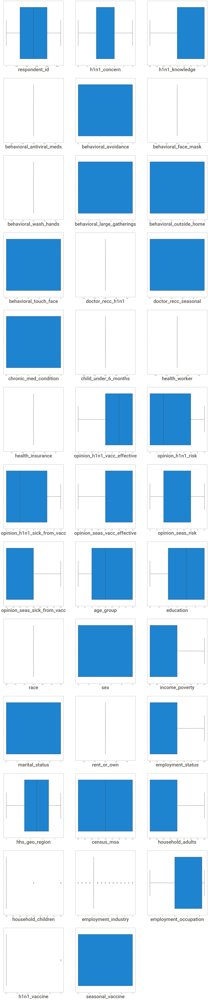

In [210]:
plt.figure(figsize=(30,150),facecolor='white')
plotnumber=1
for columns in Vaccine:
    if plotnumber<=38:
        ax=plt.subplot(13,3,plotnumber)
        sns.boxplot(Vaccine[columns])
        plt.xlabel(columns,fontsize=40)
        plotnumber+=1
plt.show()

# Scaling the Contineous variable 

In [ ]:
Vaccine.head()

#  Feature Selection

#####  Droping the unique columns & unwanted  columns also 

In [211]:
Vaccine.drop('respondent_id',axis=1,inplace=True)

In [212]:
Vaccine

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,3.0,0,2,1,0.0,1,8,2,0.0,0.0,4.0,21,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,3.0,1,2,1,0.0,0,1,0,0.0,0.0,12.0,19,0,1
2,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,3.0,1,0,1,0.0,0,9,0,2.0,0.0,14.0,21,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,3.0,0,2,1,0.0,1,5,1,0.0,0.0,4.0,21,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,3.0,0,0,0,0.0,0,9,0,1.0,0.0,4.0,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,3.0,0,0,1,0.0,1,9,2,0.0,0.0,4.0,21,0,0
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,3.0,1,0,1,0.0,0,6,1,1.0,0.0,4.0,2,0,0
26704,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,3.0,0,0,1,0.0,0,6,0,0.0,0.0,4.0,21,0,1
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,3.0,0,0,0,0.0,0,5,2,1.0,0.0,4.0,6,0,0


In [213]:
Vaccine.behavioral_face_mask.value_counts()

0.0    26707
Name: behavioral_face_mask, dtype: int64

In [214]:
Vaccine.drop('behavioral_face_mask',axis=1,inplace=True)


In [215]:
Vaccine.behavioral_antiviral_meds.value_counts()

0.0    26707
Name: behavioral_antiviral_meds, dtype: int64

In [216]:
Vaccine.drop('behavioral_antiviral_meds',axis=1,inplace=True)


In [217]:
Vaccine.behavioral_wash_hands.value_counts()

1.0    26707
Name: behavioral_wash_hands, dtype: int64

In [218]:
Vaccine.drop('behavioral_wash_hands', axis=1, inplace=True)

In [219]:
Vaccine.child_under_6_months.value_counts()

0.0    26707
Name: child_under_6_months, dtype: int64

In [220]:
Vaccine.drop('child_under_6_months', axis=1, inplace=True)

In [221]:
Vaccine.health_worker.value_counts()

0.0    26707
Name: health_worker, dtype: int64

In [222]:
Vaccine.drop('health_worker', axis=1, inplace=True)

In [223]:
Vaccine.health_insurance.value_counts()

1.0    26707
Name: health_insurance, dtype: int64

In [224]:
Vaccine.drop('health_insurance', axis=1, inplace=True)

In [225]:
Vaccine.race.value_counts()

3.0    26707
Name: race, dtype: int64

In [226]:
Vaccine.drop('race', axis=1, inplace=True)

In [227]:
Vaccine.rent_or_own.value_counts()

0.0    26707
Name: rent_or_own, dtype: int64

In [228]:
Vaccine.drop('rent_or_own', axis=1, inplace=True)

In [229]:
Vaccine.doctor_recc_h1n1.value_counts()

0.0    26707
Name: doctor_recc_h1n1, dtype: int64

In [230]:
Vaccine.drop('doctor_recc_h1n1', axis=1, inplace=True)

In [231]:
Vaccine

,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4.0,21,0,0
1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12.0,19,0,1
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14.0,21,0,0
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4.0,21,0,1
4,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4.0,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4.0,21,0,0
26703,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4.0,2,0,0
26704,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4.0,21,0,1
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4.0,6,0,0


<AxesSubplot:>

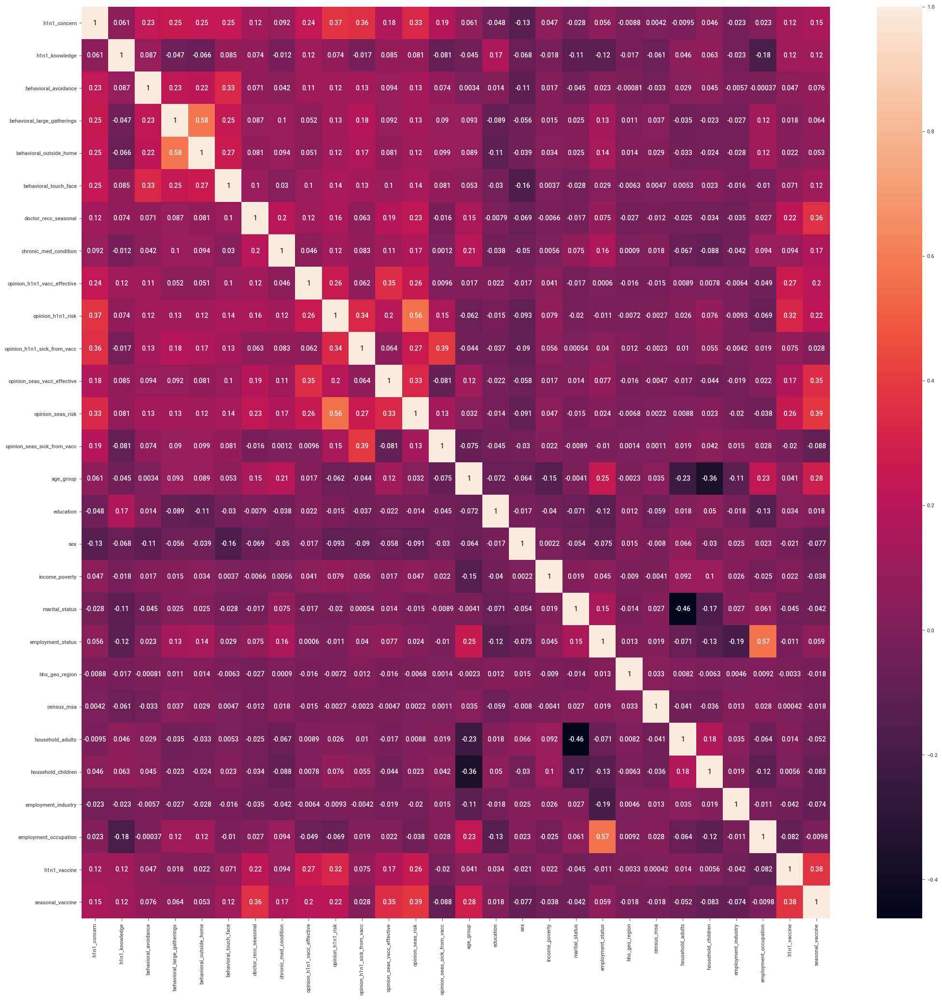

In [232]:
plt.figure(figsize=(25,25))
sns.heatmap(Vaccine.corr(),annot=True)

### There is no relationship among the data...

# Checking the duplicate rows

In [233]:
Vaccine.duplicated().sum()

3

In [234]:
Vaccine.drop_duplicates()

,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4.0,21,0,0
1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12.0,19,0,1
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14.0,21,0,0
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4.0,21,0,1
4,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4.0,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4.0,21,0,0
26703,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4.0,2,0,0
26704,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4.0,21,0,1
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4.0,6,0,0


In [235]:
Vaccine.drop_duplicates(inplace=True)

In [236]:
Vaccine.duplicated().sum()

0

In [237]:
Vaccine.shape

(26704, 28)

# Model creation

## h1n1_vaccine

In [238]:
X=Vaccine.drop(columns=['h1n1_vaccine','seasonal_vaccine'])

In [239]:
X

,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4.0,21
1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12.0,19
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14.0,21
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4.0,21
4,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4.0,21
26703,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4.0,2
26704,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4.0,21
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4.0,6


In [240]:
y=Vaccine.h1n1_vaccine

In [241]:
y

0        0
1        0
2        0
3        0
4        0
        ..
26702    0
26703    0
26704    0
26705    0
26706    0
Name: h1n1_vaccine, Length: 26704, dtype: int64

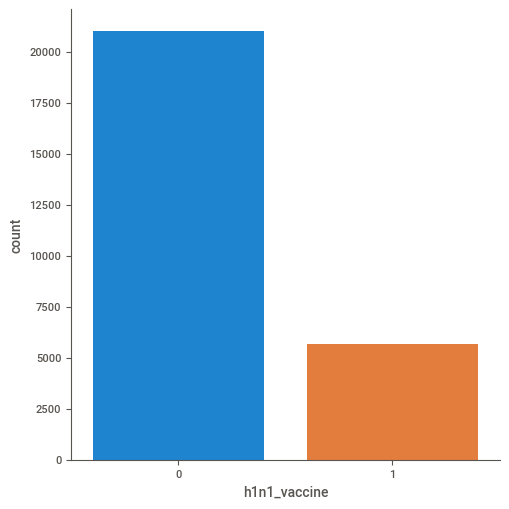

In [242]:
sns.catplot(x='h1n1_vaccine',data=Vaccine,kind='count')

In [243]:
# importing modules from sklearn libarary..
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC,LinearSVC
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron,SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,precision_score,recall_score,classification_report
from sklearn.model_selection import train_test_split

In [244]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=10)


# LogisticRegression

In [245]:
LR=LogisticRegression()

In [246]:
LR.fit(X_train,y_train) # fitting the model

LogisticRegression()

In [247]:
lr_pred=LR.predict(X_test)

In [248]:
lr_acc=accuracy_score(y_test,lr_pred)# finding accuracy score 
lr_acc

0.8180047932893948

In [249]:
f1=f1_score(y_test,lr_pred)
f1

0.43037974683544306

In [250]:
cm=confusion_matrix(y_test,lr_pred)   
print(cm)

[[5002  275]
 [ 940  459]]


In [251]:
score=classification_report(y_test,lr_pred)
print(score)

              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5277
           1       0.63      0.33      0.43      1399

    accuracy                           0.82      6676
   macro avg       0.73      0.64      0.66      6676
weighted avg       0.80      0.82      0.80      6676



# Naive Bayes

In [252]:
GUS=GaussianNB()
GUS.fit(X_train,y_train)

GaussianNB()

In [253]:
gus_pred=GUS.predict(X_test)

In [254]:
gus_acc=accuracy_score(y_test,gus_pred)
gus_acc

0.7607849011384062

In [255]:
f1=f1_score(y_test,gus_pred)
f1

0.4941400063351283

In [256]:
cm=confusion_matrix(y_test,gus_pred)
print(cm)

[[4299  978]
 [ 619  780]]


In [257]:
score=classification_report(y_test,gus_pred)
print(score)

              precision    recall  f1-score   support

           0       0.87      0.81      0.84      5277
           1       0.44      0.56      0.49      1399

    accuracy                           0.76      6676
   macro avg       0.66      0.69      0.67      6676
weighted avg       0.78      0.76      0.77      6676



# Decision tree

In [258]:
DT=DecisionTreeClassifier(max_depth=None,random_state=10,max_features=None,min_samples_leaf=30)
DT.fit(X_train,y_train)

DecisionTreeClassifier(min_samples_leaf=30, random_state=10)

In [259]:
dt_pred=DT.predict(X_test)

In [260]:
dt_acc=accuracy_score(y_test,dt_pred)
dt_acc

0.8100659077291792

In [261]:
f1=f1_score(y_test,dt_pred)
f1

0.4329159212880143

In [262]:
cm=confusion_matrix(y_test,dt_pred)
print(cm)

[[4924  353]
 [ 915  484]]


In [263]:
score=classification_report(y_test,dt_pred)
print(score)

              precision    recall  f1-score   support

           0       0.84      0.93      0.89      5277
           1       0.58      0.35      0.43      1399

    accuracy                           0.81      6676
   macro avg       0.71      0.64      0.66      6676
weighted avg       0.79      0.81      0.79      6676



# XGBoost

In [264]:
# installing XGBoost libarary
!pip install xgboost

In [265]:
from xgboost import XGBClassifier
XGB=XGBClassifier()
XGB.fit(X_train,y_train)
y_hat=XGB.predict(X_test)
cm=confusion_matrix(y_test,y_hat)
print(cm)

[[4893  384]
 [ 830  569]]


In [266]:
xgb_acc=accuracy_score(y_test,y_hat)
xgb_acc

0.8181545835829839

In [267]:
f1=f1_score(y_test,y_hat)
f1

0.48384353741496605

In [268]:
score=classification_report(y_test,y_hat)
print(score)

              precision    recall  f1-score   support

           0       0.85      0.93      0.89      5277
           1       0.60      0.41      0.48      1399

    accuracy                           0.82      6676
   macro avg       0.73      0.67      0.69      6676
weighted avg       0.80      0.82      0.80      6676



# Random Forest

In [269]:
RF=RandomForestClassifier(n_estimators=100)
RF.fit(X_train,y_train)
rf_pred=RF.predict(X_test)

In [270]:
rf_acc=accuracy_score(y_test,rf_pred)
print(rf_acc)

0.8224985020970641


In [271]:
f1=f1_score(y_test,rf_pred)
f1

0.4402456306093529

In [272]:
clf=classification_report(y_test,rf_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.84      0.95      0.89      5277
           1       0.65      0.33      0.44      1399

    accuracy                           0.82      6676
   macro avg       0.75      0.64      0.67      6676
weighted avg       0.80      0.82      0.80      6676



In [273]:
cm=confusion_matrix(y_test,rf_pred)
print(cm)

[[5025  252]
 [ 933  466]]


# Gradient Boosting

In [274]:
from sklearn.ensemble import GradientBoostingClassifier
GBM=GradientBoostingClassifier()
GBM.fit(X_train,y_train)

GradientBoostingClassifier()

In [275]:
y_gbm=GBM.predict(X_test)

In [276]:
gbm_acc=accuracy_score(y_test,y_gbm)
gbm_acc

0.8223487118034751

In [277]:
f1=f1_score(y_test,y_gbm)
f1

0.45745654162854527

In [278]:
cm=confusion_matrix(y_test,y_gbm)
print(cm)

[[4990  287]
 [ 899  500]]


In [279]:
score=classification_report(y_test,y_gbm)
print(score)

              precision    recall  f1-score   support

           0       0.85      0.95      0.89      5277
           1       0.64      0.36      0.46      1399

    accuracy                           0.82      6676
   macro avg       0.74      0.65      0.68      6676
weighted avg       0.80      0.82      0.80      6676



# KNN Classifier

In [280]:
KNN=KNeighborsClassifier(n_neighbors=7)
KNN.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=7)

In [281]:
knn_pred=KNN.predict(X_test)

In [282]:
knn_pred

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [283]:
knn_acc=accuracy_score(y_test,knn_pred)
knn_acc

0.7959856201318155

In [284]:
f1=f1_score(y_test,knn_pred)
f1

0.37119113573407203

In [285]:
clf=classification_report(y_test,knn_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.83      0.93      0.88      5277
           1       0.52      0.29      0.37      1399

    accuracy                           0.80      6676
   macro avg       0.68      0.61      0.62      6676
weighted avg       0.77      0.80      0.77      6676



In [286]:
cm=confusion_matrix(y_test,knn_pred)
print(cm)

[[4912  365]
 [ 997  402]]


In [287]:
MODELS=pd.DataFrame({
    'models':[ 'LogisticRegression','Naive Bayes','Decision tree','XGBoost',
                'Random Forest','Gradient Boosting','KNN Classifier'],
    'accuracy':[lr_acc,gus_acc,dt_acc,xgb_acc,rf_acc,gbm_acc,knn_acc]
    })
MODELS.sort_values(by='accuracy',ascending=True)

,models,accuracy
1,Naive Bayes,0.760785
6,KNN Classifier,0.795986
2,Decision tree,0.810066
0,LogisticRegression,0.818005
3,XGBoost,0.818155
5,Gradient Boosting,0.822349
4,Random Forest,0.822499


# The highest accuracy for h1n1 vaccine is 82.24% and is achieved using Gradient Boosting

# seasonal_vaccine

In [288]:
x=X
y=Vaccine.seasonal_vaccine

In [289]:
print(y)
x

0        0
1        1
2        0
3        1
4        0
        ..
26702    0
26703    0
26704    1
26705    0
26706    0
Name: seasonal_vaccine, Length: 26704, dtype: int64


,h1n1_concern,h1n1_knowledge,behavioral_avoidance,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_seasonal,chronic_med_condition,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,sex,income_poverty,marital_status,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,3,1,0,2,1,1,8,2,0.0,0.0,4.0,21
1,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,4.0,4.0,4.0,2.0,2.0,1,0,1,2,1,0,1,0,0.0,0.0,12.0,19
2,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,1.0,2.0,0,2,1,0,1,0,9,0,2.0,0.0,14.0,21
3,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,4.0,1.0,4,0,0,2,1,1,5,1,0.0,0.0,4.0,21
4,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,3.0,3.0,2.0,3.0,1.0,2.0,2,3,0,0,0,0,9,0,1.0,0.0,4.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,1.0,1.0,5.0,2.0,2.0,4,3,0,0,1,1,9,2,0.0,0.0,4.0,21
26703,1.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,2.0,2.0,5.0,1.0,1.0,0,2,1,0,1,0,6,1,1.0,0.0,4.0,2
26704,2.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,4.0,4.0,2.0,5.0,4.0,2.0,3,3,0,0,1,0,6,0,0.0,0.0,4.0,21
26705,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,1.0,2.0,4.0,1.0,2.0,0,3,0,0,0,0,5,2,1.0,0.0,4.0,6


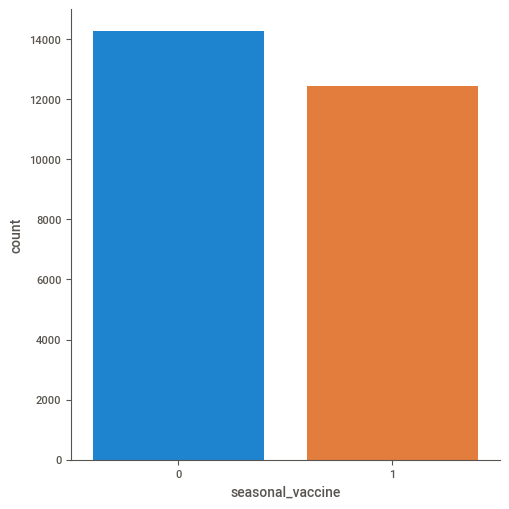

In [290]:
sns.catplot(x='seasonal_vaccine',data=Vaccine,kind='count')

In [291]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=10)


# LogisticRegression

In [292]:
LR1=LogisticRegression()
LR.fit(x_train,y_train)

LogisticRegression()

In [293]:
lr1_pred=LR.predict(x_test)

In [294]:
lr1_acc=accuracy_score(y_test,lr1_pred)
lr1_acc

0.761833433193529

In [295]:
clf=classification_report(y_test,lr1_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.76      0.80      0.78      3550
           1       0.76      0.72      0.74      3126

    accuracy                           0.76      6676
   macro avg       0.76      0.76      0.76      6676
weighted avg       0.76      0.76      0.76      6676



# Naive Bayes

In [296]:
GUS1=GaussianNB()
GUS1.fit(x_train,y_train)
gus1_pred=GUS1.predict(x_test)

In [297]:
gus1_acc=accuracy_score(y_test,gus1_pred)
gus1_acc

0.7329239065308568

In [298]:
clf=classification_report(y_test,gus1_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.75      0.74      0.75      3550
           1       0.71      0.72      0.72      3126

    accuracy                           0.73      6676
   macro avg       0.73      0.73      0.73      6676
weighted avg       0.73      0.73      0.73      6676



# Decision tree

In [299]:
DT1=DecisionTreeClassifier(max_depth=None,random_state=10,max_features=None,min_samples_leaf=30)
DT1.fit(x_train,y_train)

DecisionTreeClassifier(min_samples_leaf=30, random_state=10)

In [300]:
dt1_pred=DT1.predict(x_test)

In [301]:
dt1_acc=accuracy_score(y_test,dt1_pred)
dt1_acc

0.7502995805871779

In [302]:
clf=classification_report(y_test,dt1_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.76      0.77      0.77      3550
           1       0.74      0.72      0.73      3126

    accuracy                           0.75      6676
   macro avg       0.75      0.75      0.75      6676
weighted avg       0.75      0.75      0.75      6676



# XGBoost

In [303]:
XGB1=XGBClassifier()
XGB1.fit(x_train,y_train)
xgb_pred=XGB1.predict(x_test)

In [304]:
xgb1_acc=accuracy_score(y_test,xgb_pred)
xgb1_acc

0.756141402037148

In [305]:
clf=classification_report(y_test,xgb_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.77      0.77      0.77      3550
           1       0.74      0.74      0.74      3126

    accuracy                           0.76      6676
   macro avg       0.76      0.76      0.76      6676
weighted avg       0.76      0.76      0.76      6676



# Random Forest

In [306]:
RF1=RandomForestClassifier(n_estimators=100)
RF1.fit(x_train,y_train)
rf1_pred=RF1.predict(x_test)

In [307]:
rf1_acc=accuracy_score(y_test,rf1_pred)
rf1_acc

0.7667765128819652

In [308]:
clf=classification_report(y_test,rf1_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.78      0.79      0.78      3550
           1       0.75      0.74      0.75      3126

    accuracy                           0.77      6676
   macro avg       0.77      0.77      0.77      6676
weighted avg       0.77      0.77      0.77      6676



# Gradient Boosting

In [309]:
GB1=GradientBoostingClassifier()
GB1.fit(x_train,y_train)
gb1_pred=GB1.predict(x_test)

In [310]:
gb1_acc=accuracy_score(y_test,gb1_pred)
gb1_acc

0.7696225284601558

In [311]:
clf=classification_report(y_test,gb1_pred)
print(clf)

              precision    recall  f1-score   support

           0       0.78      0.79      0.79      3550
           1       0.76      0.74      0.75      3126

    accuracy                           0.77      6676
   macro avg       0.77      0.77      0.77      6676
weighted avg       0.77      0.77      0.77      6676



In [312]:
MODELS1=pd.DataFrame({
    'models':[ 'LogisticRegression','Naive Bayes','Decision tree','XGBoost',
                'Random Forest','Gradient Boosting',],
    'accuracy':[lr1_acc,gus1_acc,dt1_acc,xgb1_acc,rf1_acc,gb1_acc,]
    })
MODELS1.sort_values(by='accuracy',ascending=True)

,models,accuracy
1,Naive Bayes,0.732924
2,Decision tree,0.750300
3,XGBoost,0.756141
0,LogisticRegression,0.761833
4,Random Forest,0.766777
5,Gradient Boosting,0.769623


# The maximum accuracy for seasonal vaccine is 76.96%.This accuracy has been achieved by Gradient Boosting

In [ ]:
# 

### In conclusion, data analysis and predictive modeling are critical tools for understanding and addressing public health issues such as vaccination. By performing a comprehensive data analysis, we can uncover patterns and relationships within the data, gain insights into the factors that influence vaccine adoption, and make data-driven recommendations for future research and public health interventions. Additionally, predictive modeling can help us forecast future trends in vaccine adoption and assess the potential impact of different interventions on public health outcomes. By combining data analysis and predictive modeling, we can develop a more nuanced and evidence-based understanding of the complex factors that influence vaccination and work towards building healthier and more resilient communities.